In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skfolio.datasets import load_sp500_dataset
from skfolio.preprocessing import prices_to_returns

# Load the S&P 500 prices dataset
prices = load_sp500_dataset()

# Filter for the last two years of data
end_date = prices.index[-1]
start_date = end_date - pd.DateOffset(years=10)
prices_10yr = prices.loc[start_date:end_date]

# Convert prices to returns
X = prices_to_returns(prices_10yr)

print(f"Data range: {X.index[0].date()} to {X.index[-1].date()}")


Data range: 2012-12-31 to 2022-12-28


In [2]:
prices_10yr.columns

Index(['AAPL', 'AMD', 'BAC', 'BBY', 'CVX', 'GE', 'HD', 'JNJ', 'JPM', 'KO',
       'LLY', 'MRK', 'MSFT', 'PEP', 'PFE', 'PG', 'RRC', 'UNH', 'WMT', 'XOM'],
      dtype='object')

In [3]:
prices.shape

(8313, 20)

In [4]:
from skfolio.optimization import MeanRisk
from skfolio.model_selection import (
    WalkForward,
    CombinatorialPurgedCV,
    MultipleRandomizedCV,
)
from sklearn.model_selection import KFold
from skfolio.pre_selection import DropZeroVariance
from sklearn.pipeline import Pipeline

# Define the GMVP strategy within a pipeline to handle potential zero-variance issues
gmvp_strategy = MeanRisk()

# Define the cross-validation splitters suitable for ~500 data points
cv_kfold = KFold(n_splits=5, shuffle=False)
cv_walkforward = WalkForward(train_size=252, test_size=21, expend_train=False)
cv_combinatorial = CombinatorialPurgedCV(n_folds=10, n_test_folds=8)
cv_randomized = MultipleRandomizedCV(
    walk_forward=WalkForward(train_size=252, test_size=21, expend_train=False),
    n_subsamples=100,
    asset_subset_size=5,
    window_size=None,
)

In [5]:
from skfolio.model_selection import cross_val_predict

# Run backtest with KFold
gmvp_kfold = cross_val_predict(gmvp_strategy, X[X.index >= pd.to_datetime('2013-12-31')], cv=cv_kfold)
gmvp_kfold.name = "GMVP (KFold)"

# Run backtest with WalkForward
gmvp_walkforward = cross_val_predict(gmvp_strategy, X, cv=cv_walkforward)
gmvp_walkforward.name = "GMVP (WalkForward)"


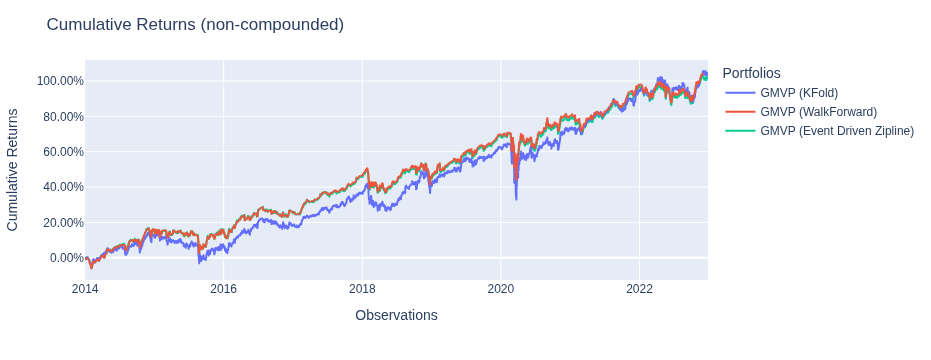

In [6]:
from skfolio import Population

# Combine all results into a single Population for plotting
population = Population([
    gmvp_kfold,
    gmvp_walkforward,
])

# Plot the cumulative returns
single_path_fig = population.plot_cumulative_returns()

import plotly.graph_objects as go

# Load your Zipline backtest results
zipline_results = pd.read_csv('./zipline_backtest/gmvp_backtest_results.csv', index_col=0, parse_dates=True)
zipline_returns = zipline_results['returns']
zipline_returns.index = pd.to_datetime(zipline_returns.index.strftime('%Y-%m-%d'))

# Calculate non-compounded (arithmetic) cumulative returns starting at 0
zipline_cumulative = zipline_returns.cumsum()

# Add Zipline trace to the existing figure
single_path_fig.add_trace(
    go.Scatter(
        x=zipline_cumulative.index,
        y=zipline_cumulative.values,
        mode='lines',
        name='GMVP (Event Driven Zipline)',
    )
)

# Show the figure
single_path_fig.show()

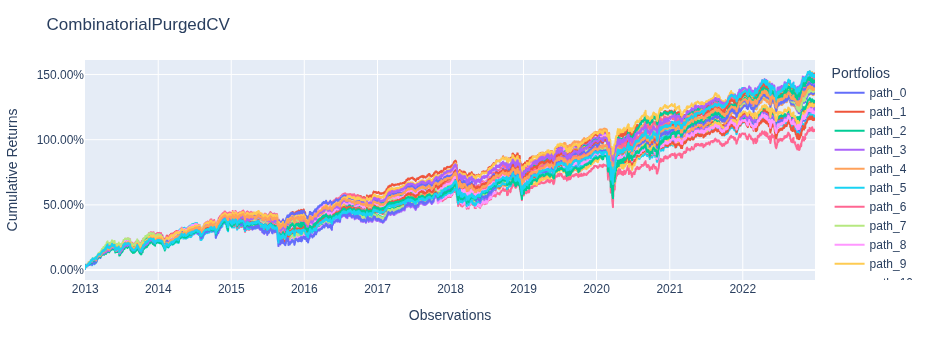

In [7]:
# Run backtest with CombinatorialPurgedCV
gmvp_combinatorial = cross_val_predict(gmvp_strategy, X, cv=cv_combinatorial)
gmvp_combinatorial.name = "GMVP (CombinatorialPurgedCV)"

fig_combinatorial = gmvp_combinatorial.plot_cumulative_returns()
fig_combinatorial.update_layout(title="CombinatorialPurgedCV")

fig_combinatorial.show()

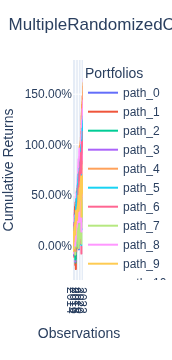

In [8]:
# Run backtest with MultipleRandomizedCV
gmvp_randomized = cross_val_predict(gmvp_strategy, X, cv=cv_randomized)
gmvp_randomized.name = "GMVP (MultipleRandomizedCV)"

fig_randomized = gmvp_randomized.plot_cumulative_returns()
fig_randomized.update_layout(title="MultipleRandomizedCV")

fig_randomized.show()